In [1]:
import plotly.express as px
import numpy as np

import annealing as an
import zad2_cost_functions as cf

## Binary images

Bardzo ciekawy i trafny przykład zastosowania algorytmu symulowanego wyżarzania. Powstałe obrazy bitowe dla odpowiednio zdefiniowanej funkcji energii przypominają sieć krystaliczną. Poniżej kilka przykładów dla różnych funkcji kosztu, które zdefiniowane są w pliku `zad2_cost_functions.py`.

By uzyskać stan sąsiedni, zamieniam losowo pewną ilość punktów w macierzy. Dla większej temperatury, zamienianych punktów jest więcej. 

Poprzez `zad2_gen_imgs.py` możemy wygenerować i zapisać wiele map bitowych w celu ich późniejszej analizy. W folderze `zad2_imgs/` znajduje się kilka wygenerowanych przeze mnie. Niestety większe bitmapy nie dość, że z samego powodu rozmiaru wymagają więcej mocy obliczeniowej do wyżarzenia, to funckje kosztu jakie należałoby zdefinować dla ciekawszych efektów byłyby także bardziej kosztowne obliczeniowo. Stąd wygenerowane zdjęcia mogą wydawać się w większości nieciekawe.

Niestety nie zauważyłem istotnych różnic w wyżarzanium jeśli chodzi o szybkość spadku temperatury. Wolniej chłodzące się procesy wyżarzania z reguły potrzebowały więcej iteracji, by osiągnąć podobny poziom funkcji kosztu, jednak zbiegały do bardzo podobnie wyglądających obrazów.


In [2]:
# Generate a random binary image of size n x n.
# Density specifies how many 'ones' we have in the image.
n = 100
density = 0.2
A = np.random.uniform(0, 1, size=(n, n))> (1-density)

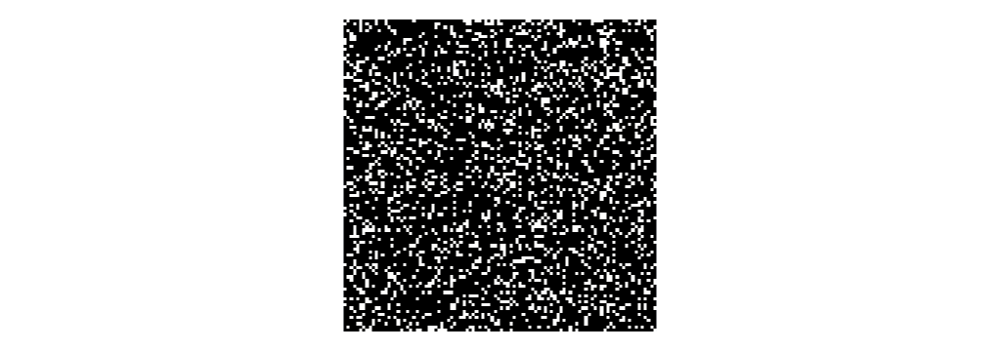

In [3]:
# Plot. 'Ones' are white.
def plot(A):
    fig = px.imshow(A, color_continuous_scale='gray')
    fig.update_layout(coloraxis_showscale=False,
                     margin=dict(l=50, r=50, t=20, b=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    return fig
plot(A)

In [4]:
# Random swap of some points. Temperature increases number of points swapped.
def swap(A, T):
    A = np.copy(A)
    n_pts = int(20 + 2*T)
    pts = np.random.randint(len(A), size=(2,n_pts))
    x, y = np.unique(pts, axis=1)
    per = np.random.permutation(len(x))
    A[x,y] = A[x[per],y[per]]
    return A

#### Example 1
Penalizes difference in neighbouring fields. Length 1 cross shaped.
``` 
  +  
+ o +
  +  
```

In [18]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost1,
    update_fun = swap,
    T_change_fun = lambda T: T*0.998,
    iters=6000,
    verbose=True
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

Starting...
0%, iter = 0, cost = 6510.0, T = 2000
10%, iter = 600, cost = 6484.0, T = 601.67
20%, iter = 1200, cost = 6224.0, T = 181.0
30%, iter = 1800, cost = 5922.0, T = 54.45
40%, iter = 2400, cost = 4952.0, T = 16.38
50%, iter = 3000, cost = 3962.0, T = 4.93
60%, iter = 3600, cost = 3400.0, T = 1.48
70%, iter = 4200, cost = 3032.0, T = 0.45
80%, iter = 4800, cost = 2808.0, T = 0.13
90%, iter = 5400, cost = 2672.0, T = 0.04
100%, iter = 6000, cost = 2582.0, T = 0.01
Finished!


#### Outcome
We can see that points form clusters to minimize the penalty. Although not too efficiently - one big cluster could do very well, but this technique has hard time approaching such result.

In [19]:
plot(x)

### Example 2
Penalizes difference in horizontally neighbouring fields. 
Rewards difference in vertically neighbouring fields. 
Length 1 cross shaped.
```
  -   
+ o +
  -  
```

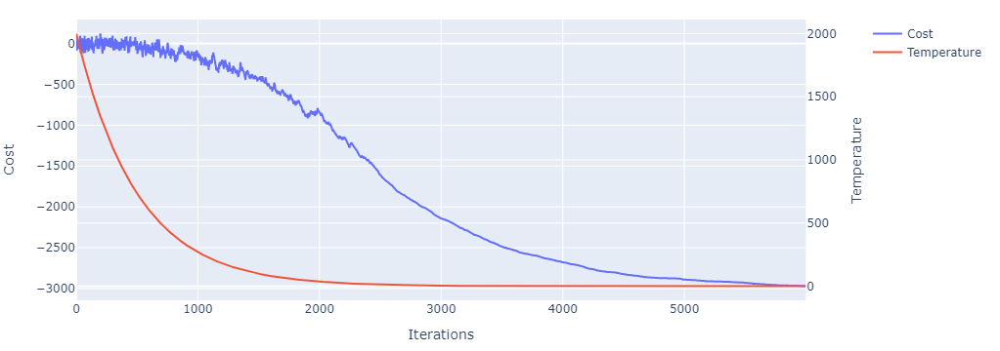

In [7]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost2,
    update_fun = swap,
    T_change_fun = lambda T: T*0.998,
    iters=6000,
    verbose=False
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

#### Outcome
We can see that points form sort of horizontal lines. Cool.

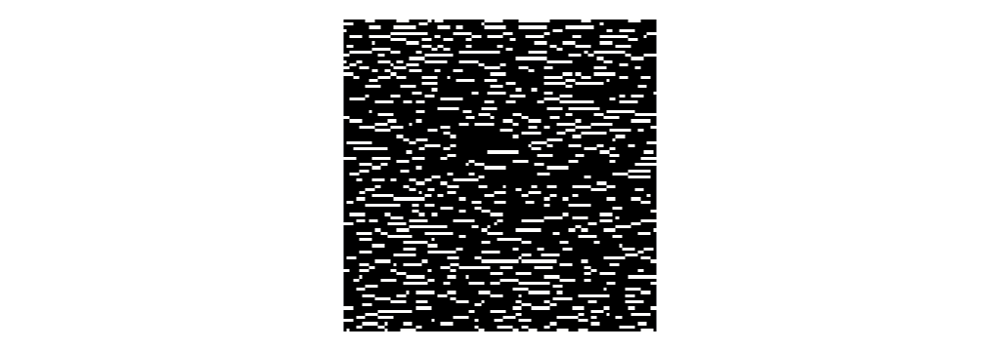

In [8]:
plot(x)

### Example 3
Penalizes tight clustering. 
Length 1 box shaped. Applies to all fields.
```
+ + + 
+ o +
+ + +
```

Starting...
0%, iter = 0, cost = 47920.0, T = 2000
10%, iter = 600, cost = 47294.0, T = 601.67
20%, iter = 1200, cost = 45656.0, T = 181.0
30%, iter = 1800, cost = 42970.0, T = 54.45
40%, iter = 2400, cost = 40022.0, T = 16.38
50%, iter = 3000, cost = 37874.0, T = 4.93
60%, iter = 3600, cost = 37062.0, T = 1.48
70%, iter = 4200, cost = 36614.0, T = 0.45
80%, iter = 4800, cost = 36370.0, T = 0.13
90%, iter = 5400, cost = 36208.0, T = 0.04
100%, iter = 6000, cost = 36128.0, T = 0.01
Finished!


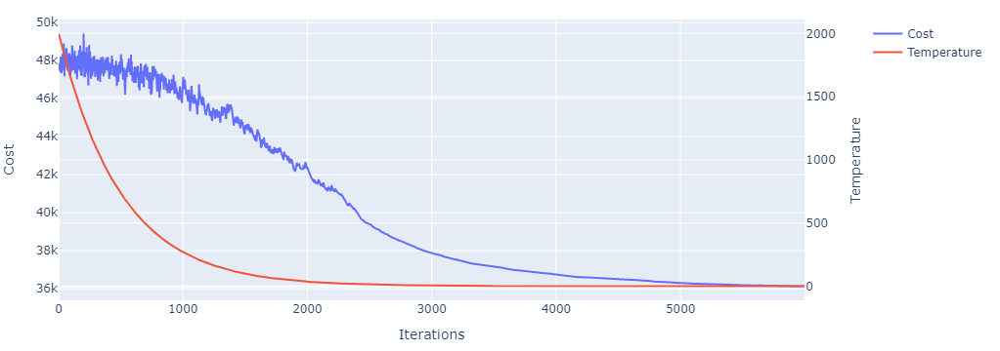

In [9]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost3,
    update_fun = swap,
    T_change_fun = lambda T: T*0.998,
    iters=6000
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

##### Outcome
As expected, 'ones' are spread out very evenly to minimize grouping.

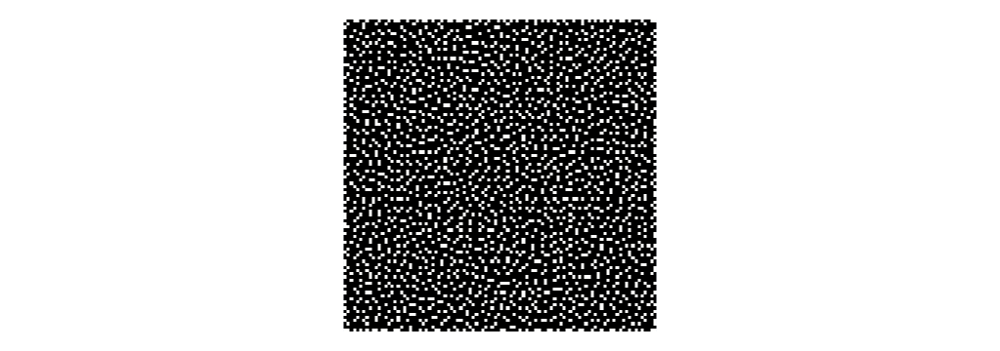

In [10]:
plot(x)

### Example 4
Rewards diagonal chains harshly penalizes horizontal and vertical chains.
```
-   +   -
  - + -  
+ + o + +
  - + -  
-   +   -
```

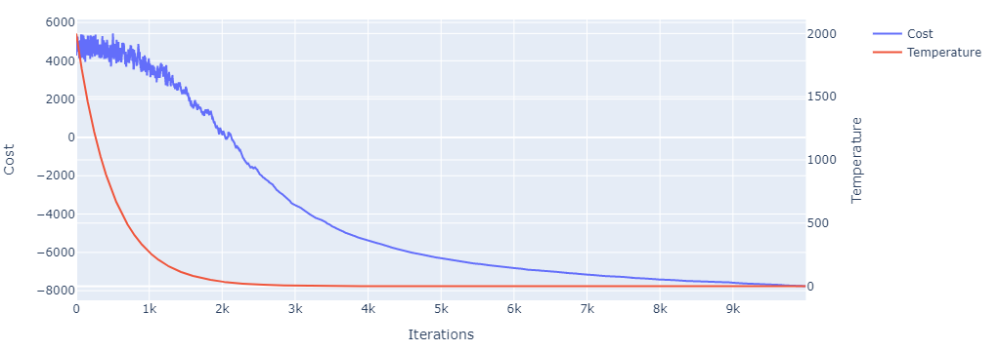

In [11]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost4,
    update_fun = swap,
    T_change_fun = lambda T: T*0.998,
    iters=10000,
    verbose=False
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

#### Outcome
Clearly visible diagonal chains, great!
Having strong penalty for chaining in rows/columns and light reward for chaining diagonally makes the end result much clearer than
having aforementioned penalty and reward of equal strength. 

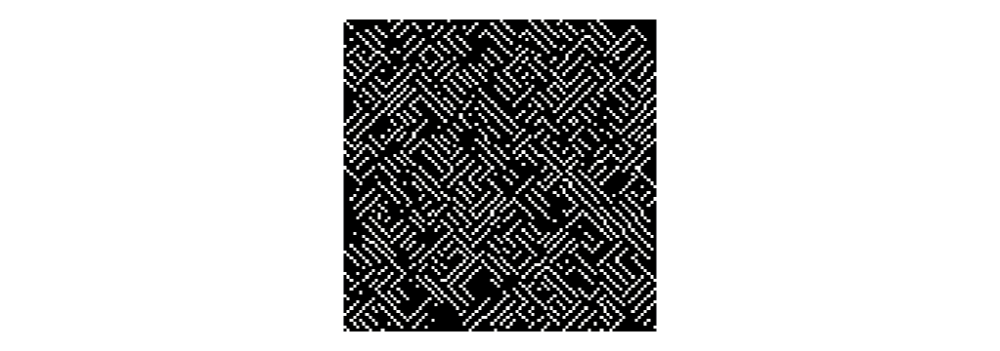

In [12]:
plot(x)

### Example 5
Harshly penalizes close neighbours, rewards mid range neighbours.
```
- - - - -
- + + + - 
- + o + -
- + + + -
- - - - -
```

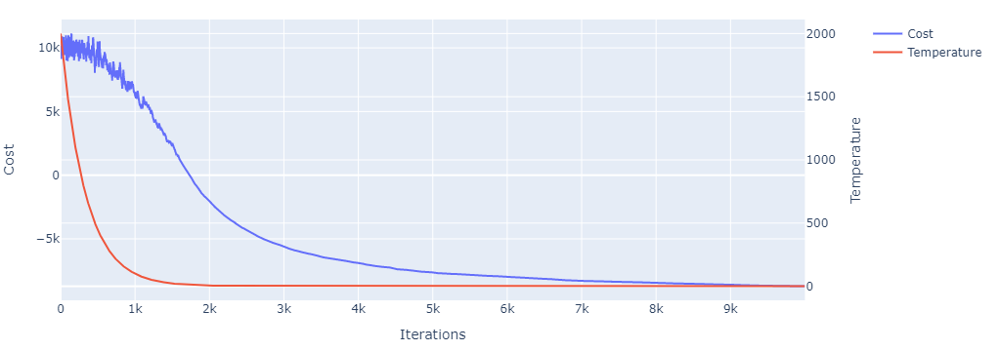

In [13]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost5,
    update_fun = swap,
    T_change_fun = lambda T: T*0.997,
    iters=10000,
    verbose=False
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

#### Outcome
Points are spread out, but not so randomly.
The result differs from example 3 in the visible grid structure

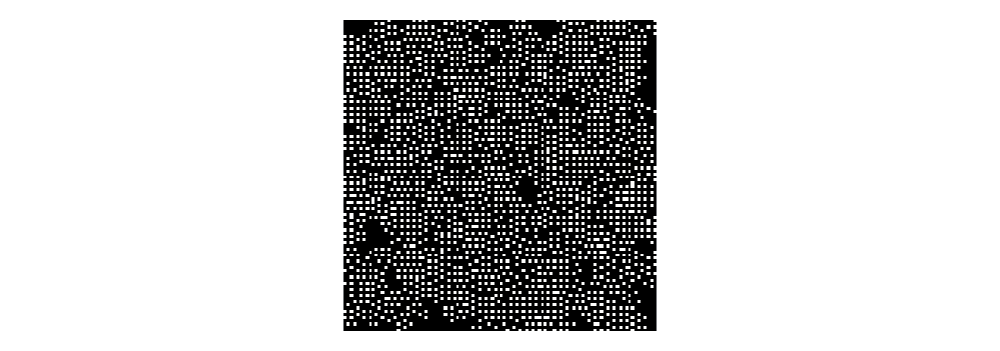

In [14]:
plot(x)

### Example 6
This shape - not sure how to describe it.
```
  + - +  
-   +   - 
+ - o - +
-   +   -
  + - + 
```

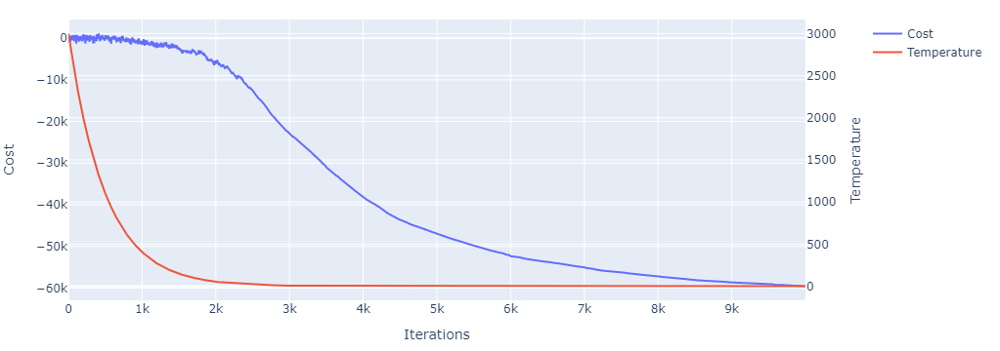

In [15]:
x, cost_hist, T_hist = an.anneal(
    x_0 = A,
    cost_fun = cf.cost6,
    update_fun = swap,
    T_0 = 3000,
    T_change_fun = lambda T: T*0.998,
    iters=10000,
    verbose=False
)
assert A.sum() == x.sum() # Assure the process did not alter the number of 'ones'
an.plot_annealing(cost_hist, T_hist) # plot

#### Outcome
We can observe checkboard-like structure, although it is more complex.

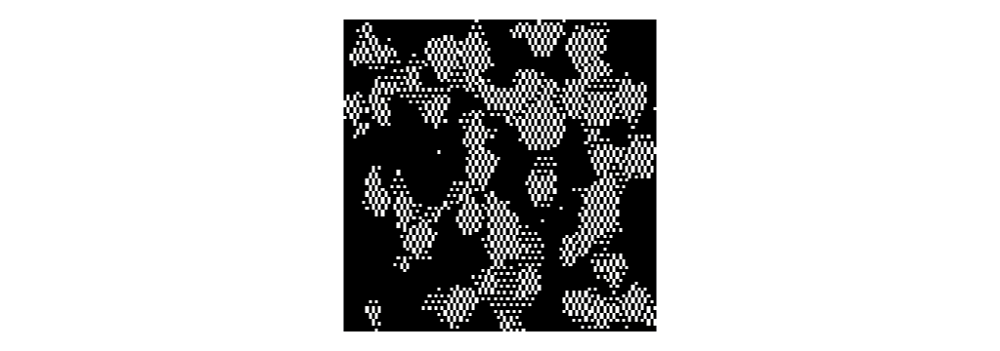

In [16]:
plot(x)

### Temperature decay comparison

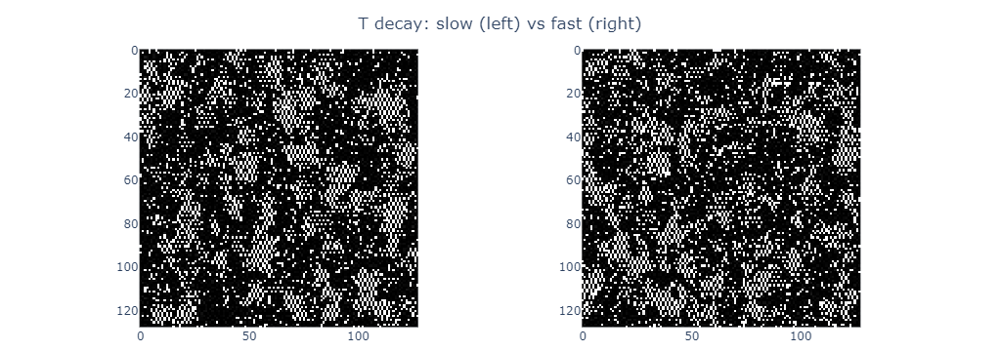

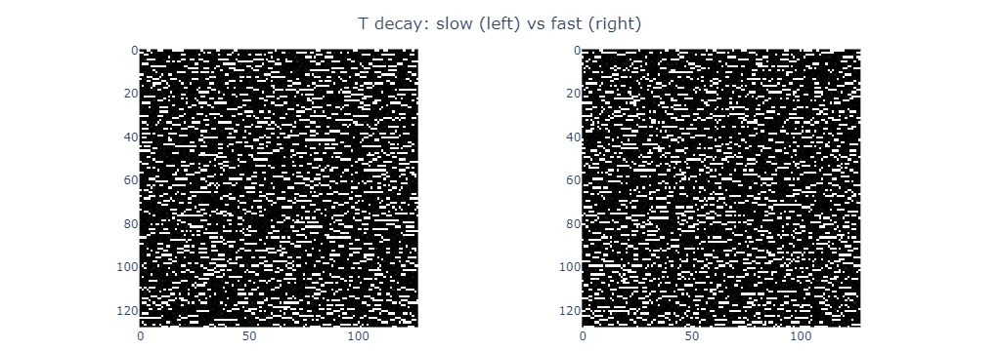

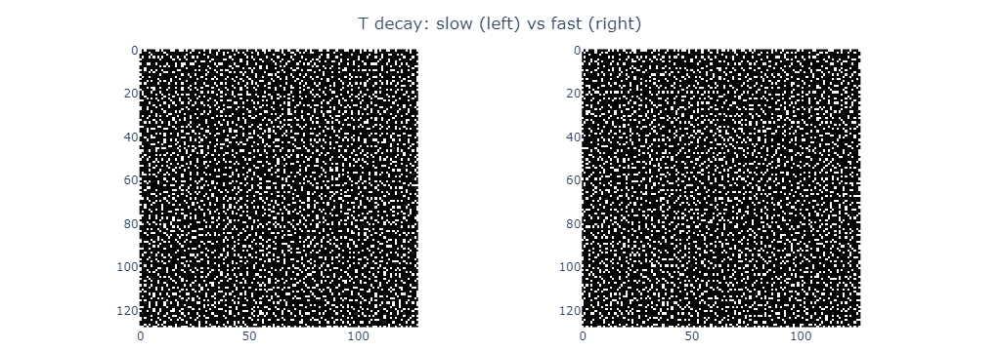

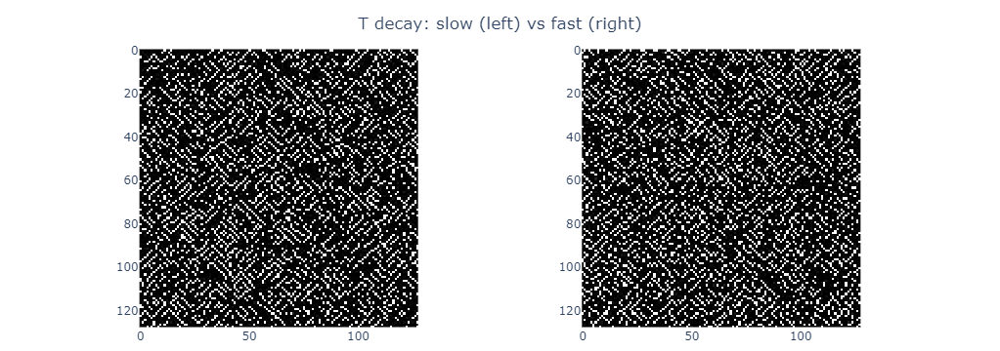

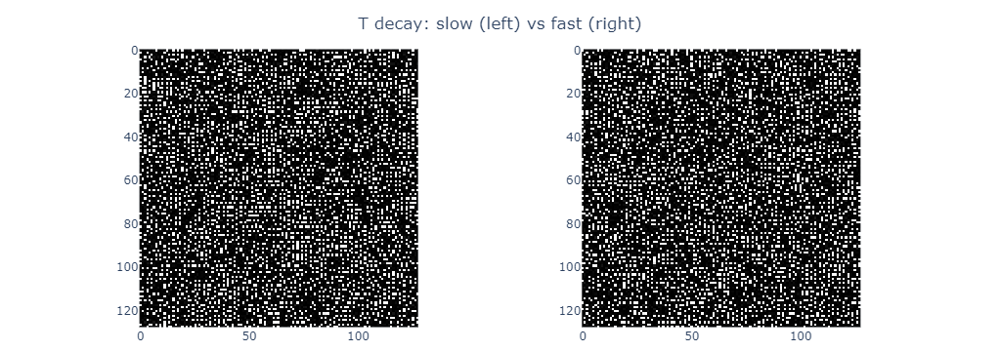

In [75]:
from skimage import io
from PIL import Image
from io import BytesIO
import base64

def plot_decay_comparison(cost, dens, size):
    fig = make_subplots(1, 2)
    img_name = lambda x: f'zad2_imgs/cost{cost}-dens{dens}-size{size}-cooldown{x}.jpeg'
    
    img = io.imread(img_name(1))
    pil_img = Image.fromarray(img) # PIL image object
    prefix = "data:image/png;base64,"
    with BytesIO() as stream:
        pil_img.save(stream, format="png")
        base64_string = prefix + base64.b64encode(stream.getvalue()).decode("utf-8")
    fig.add_trace(go.Image(source=base64_string), 1, 1)
    
    img = io.imread(img_name(2))
    pil_img = Image.fromarray(img) # PIL image object
    prefix = "data:image/png;base64,"
    with BytesIO() as stream:
        pil_img.save(stream, format="png")
        base64_string = prefix + base64.b64encode(stream.getvalue()).decode("utf-8")
    fig.add_trace(go.Image(source=base64_string), 1, 2)
    
    fig.update_layout(
        title={
        'text': "T decay: slow (left) vs fast (right)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
            
        margin=dict(l=100, r=100, t=50, b=10)
    )
    
    return fig

for i in range(5):
    plot_decay_comparison(i+1,0.2,128).show()